# Regression Ensemble Learning

## Input Data & Library

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving nyc_taxi_trip_duration.csv to nyc_taxi_trip_duration.csv


In [ ]:
df = pd.read_csv('nyc_taxi_trip_duration.csv')
df.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id1080784,2,29-02-16 16:40,29-02-16 16:47,1,-73.953918,40.778873,-73.963875,40.771164,N,400
1,id0889885,1,11-03-16 23:35,11-03-16 23:53,2,-73.988312,40.731743,-73.994751,40.694931,N,1100
2,id0857912,2,21-02-16 17:59,21-02-16 18:26,2,-73.997314,40.721458,-73.948029,40.774918,N,1635
3,id3744273,2,05-01-16 9:44,05-01-16 10:03,6,-73.961670,40.759720,-73.956779,40.780628,N,1141
4,id0232939,1,17-02-16 6:42,17-02-16 6:56,1,-74.017120,40.708469,-73.988182,40.740631,N,848


## Data Exploration

In [ ]:
#check all null values
df.isna().sum()

id                    0
vendor_id             0
pickup_datetime       0
dropoff_datetime      0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
trip_duration         0
dtype: int64

In [ ]:
#convert datetime value from string to datetime format
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])
df['dropoff_datetime'] = pd.to_datetime(df['dropoff_datetime'])

In [ ]:
#add distance column based on pickup and dropoff longitude-latitude
from IPython.display import clear_output
from geopy.distance import geodesic
distance = []
for index in df['pickup_latitude'].index:
    clear_output()
    print(index)
    distance.append(geodesic((df['pickup_latitude'].iloc[index],df['pickup_longitude'].iloc[index]),(df['dropoff_latitude'].iloc[index],df['dropoff_longitude'].iloc[index])).miles)
df['distance'] = distance
df.head()

729286


In [ ]:
#convert distance from miles to km
df['distance'] = 1.60934 * df['distance']
df.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,distance
0,id1080784,2,2016-02-29 16:40:00,2016-02-29 16:47:00,1,-73.953918,40.778873,-73.963875,40.771164,N,400,1.930833
1,id0889885,1,2016-11-03 23:35:00,2016-11-03 23:53:00,2,-73.988312,40.731743,-73.994751,40.694931,N,1100,6.636814
2,id0857912,2,2016-02-21 17:59:00,2016-02-21 18:26:00,2,-73.997314,40.721458,-73.948029,40.774918,N,1635,11.668386
3,id3744273,2,2016-05-01 09:44:00,2016-05-01 10:03:00,6,-73.961670,40.759720,-73.956779,40.780628,N,1141,3.795274
4,id0232939,1,2016-02-17 06:42:00,2016-02-17 06:56:00,1,-74.017120,40.708469,-73.988182,40.740631,N,848,6.965455


In [ ]:
#plot trip duration
import plotly.express as px
fig = px.box(df.trip_duration, y="trip_duration", width=400, height=600)
fig.show()

In [ ]:
trip_duration_outlier_lower = df[df['trip_duration'] < 60]
trip_duration_outlier_lower

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,distance
136,id1514658,1,2016-03-22 08:23:00,2016-03-22 08:23:00,2,-73.902054,40.764011,-73.902061,40.764023,N,7,0.002294
415,id0446273,2,2016-04-04 12:56:00,2016-04-04 12:56:00,5,-73.863091,40.769840,-73.863312,40.769630,N,10,0.048059
448,id1326538,2,2016-03-18 12:19:00,2016-03-18 12:19:00,1,-73.974197,40.762718,-73.975693,40.760723,N,9,0.410392
785,id1764292,1,2016-03-15 15:13:00,2016-03-15 15:14:00,1,-73.985260,40.763458,-73.982109,40.767265,N,54,0.803888
1493,id1359484,1,2016-04-28 09:59:00,2016-04-28 10:00:00,1,-73.996864,40.737515,-73.998665,40.738136,N,58,0.268804
...,...,...,...,...,...,...,...,...,...,...,...,...
728793,id0802812,1,2016-12-05 05:52:00,2016-12-05 05:52:00,1,-73.985931,40.767986,-73.985931,40.767982,N,6,0.000683
729011,id2277062,2,2016-02-17 05:26:00,2016-02-17 05:26:00,2,-73.978523,40.765221,-73.979462,40.765781,N,12,0.162182
729022,id3715420,1,2016-05-29 12:04:00,2016-05-29 12:04:00,1,-73.945587,40.751602,-73.945602,40.751568,N,27,0.006476
729073,id1124394,2,2016-12-03 22:38:00,2016-12-03 22:38:00,2,-73.962418,40.758919,-73.960655,40.761398,N,49,0.503713


In [ ]:
trip_duration_outlier_upper = df[df['trip_duration'] > 2092]
trip_duration_outlier_upper

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,distance
15,id2930166,2,2016-02-21 01:56:00,2016-02-22 01:52:00,1,-74.002876,40.734131,-73.955399,40.767502,N,86164,8.786677
26,id1766292,1,2016-06-26 14:50:00,2016-06-26 15:29:00,2,-74.000168,40.758141,-73.947266,40.764793,N,2350,7.286475
42,id1100632,1,2016-02-03 16:29:00,2016-02-03 17:06:00,1,-73.997459,40.724735,-73.954414,40.669811,N,2189,11.429257
55,id3695961,1,2016-05-30 23:04:00,2016-05-30 23:42:00,1,-73.984367,40.760208,-73.913246,40.686783,N,2280,16.300348
74,id3204761,2,2016-03-06 17:29:00,2016-03-06 18:05:00,1,-74.006973,40.675991,-73.949379,40.717659,N,2151,10.808503
...,...,...,...,...,...,...,...,...,...,...,...,...
729221,id2450253,2,2016-01-28 23:14:00,2016-01-28 23:59:00,1,-73.979088,40.755871,-73.949471,40.594769,N,2667,29.071727
729232,id1609346,2,2016-06-18 00:43:00,2016-06-18 01:38:00,1,-73.999741,40.728352,-73.964348,40.760529,N,3282,7.497416
729273,id2884987,2,2016-11-04 10:37:00,2016-11-04 11:31:00,2,-73.782272,40.644493,-74.009514,40.713406,N,3226,33.280290
729276,id0592933,1,2016-09-06 19:12:00,2016-09-06 19:53:00,1,-73.964828,40.757729,-73.790283,40.643536,N,2485,31.306294


In [ ]:
#plot distance
fig = px.box(df.distance, y="distance", width=400, height=600)
fig.show()

In [ ]:
distance_outlier_lower = df[df['distance'] < 0.0804672]
distance_outlier_lower

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,distance
63,id2751531,1,2016-01-05 12:15:00,2016-01-05 12:18:00,1,-73.823219,40.763676,-73.823242,40.763725,N,165,0.009392
136,id1514658,1,2016-03-22 08:23:00,2016-03-22 08:23:00,2,-73.902054,40.764011,-73.902061,40.764023,N,7,0.002294
263,id3155891,2,2016-06-28 11:21:00,2016-06-28 11:25:00,2,-73.996422,40.298828,-73.996422,40.298828,N,240,0.000000
327,id0786923,2,2016-03-26 13:34:00,2016-03-26 13:37:00,1,-73.996323,40.753460,-73.996323,40.753460,N,159,0.000000
415,id0446273,2,2016-04-04 12:56:00,2016-04-04 12:56:00,5,-73.863091,40.769840,-73.863312,40.769630,N,10,0.048059
...,...,...,...,...,...,...,...,...,...,...,...,...
728838,id1232120,2,2016-05-29 04:04:00,2016-05-29 04:11:00,2,-73.984558,40.750839,-73.984558,40.750839,N,421,0.000000
729022,id3715420,1,2016-05-29 12:04:00,2016-05-29 12:04:00,1,-73.945587,40.751602,-73.945602,40.751568,N,27,0.006476
729025,id3524028,2,2016-06-04 18:03:00,2016-06-04 18:26:00,1,-74.083611,40.632401,-74.083611,40.632401,N,1369,0.000000
729119,id2265972,1,2016-07-01 07:51:00,2016-07-01 07:51:00,3,-73.782356,40.644211,-73.782364,40.644211,Y,23,0.001039


In [ ]:
distance_outlier_upper = df[df['distance'] > 7.83971]
distance_outlier_upper

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,distance
2,id0857912,2,2016-02-21 17:59:00,2016-02-21 18:26:00,2,-73.997314,40.721458,-73.948029,40.774918,N,1635,11.668386
7,id1663798,2,2016-06-19 16:48:00,2016-06-19 17:06:00,1,-73.963890,40.765434,-73.872429,40.774200,N,1101,12.525354
8,id2436943,2,2016-03-28 19:17:00,2016-03-28 19:48:00,2,-73.872887,40.774281,-73.979019,40.761879,N,1886,14.590108
9,id2933909,1,2016-10-04 22:01:00,2016-10-04 22:25:00,1,-73.987823,40.740982,-73.999153,40.686451,N,1429,9.866511
15,id2930166,2,2016-02-21 01:56:00,2016-02-22 01:52:00,1,-74.002876,40.734131,-73.955399,40.767502,N,86164,8.786677
...,...,...,...,...,...,...,...,...,...,...,...,...
729291,id2794268,2,2016-05-30 09:35:00,2016-05-30 09:47:00,1,-73.997948,40.761372,-74.013512,40.714489,N,699,8.641620
729292,id1145011,2,2016-08-02 09:21:00,2016-08-02 09:48:00,1,-73.870873,40.773720,-73.968079,40.697651,N,1628,18.958700
729306,id0893194,2,2016-06-03 14:54:00,2016-06-03 15:49:00,6,-73.983070,40.757626,-73.861641,40.768276,N,3306,16.609950
729314,id3226129,2,2016-03-21 03:43:00,2016-03-21 04:05:00,2,-73.987740,40.748222,-73.949585,40.680737,N,1338,13.129340


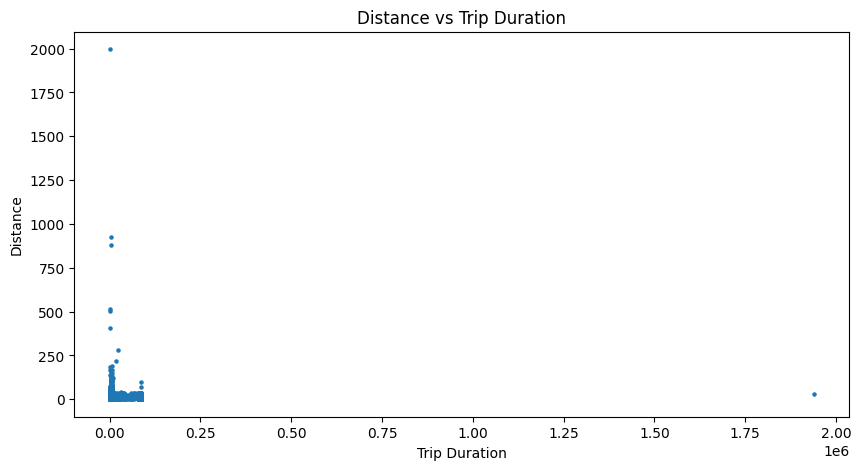

In [ ]:
plt.figure(figsize = (10,5))
plt.scatter(df.trip_duration, df.distance , s=5, alpha=1)
plt.ylabel('Distance')
plt.xlabel('Trip Duration')
plt.title('Distance vs Trip Duration')
plt.show()

## Preprocess Data

### Outlier Treatment

In [ ]:
df_copy = df.copy()
df_copy

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,distance
0,id1080784,2,2016-02-29 16:40:00,2016-02-29 16:47:00,1,-73.953918,40.778873,-73.963875,40.771164,N,400,1.930833
1,id0889885,1,2016-11-03 23:35:00,2016-11-03 23:53:00,2,-73.988312,40.731743,-73.994751,40.694931,N,1100,6.636814
2,id0857912,2,2016-02-21 17:59:00,2016-02-21 18:26:00,2,-73.997314,40.721458,-73.948029,40.774918,N,1635,11.668386
3,id3744273,2,2016-05-01 09:44:00,2016-05-01 10:03:00,6,-73.961670,40.759720,-73.956779,40.780628,N,1141,3.795274
4,id0232939,1,2016-02-17 06:42:00,2016-02-17 06:56:00,1,-74.017120,40.708469,-73.988182,40.740631,N,848,6.965455
...,...,...,...,...,...,...,...,...,...,...,...,...
729317,id3905982,2,2016-05-21 13:29:00,2016-05-21 13:34:00,2,-73.965919,40.789780,-73.952637,40.789181,N,296,1.807393
729318,id0102861,1,2016-02-22 00:43:00,2016-02-22 00:48:00,1,-73.996666,40.737434,-74.001320,40.731911,N,315,1.172504
729319,id0439699,1,2016-04-15 18:56:00,2016-04-15 19:08:00,1,-73.997849,40.761696,-74.001488,40.741207,N,673,3.694905
729320,id2078912,1,2016-06-19 09:50:00,2016-06-19 09:58:00,1,-74.006706,40.708244,-74.013550,40.713814,N,447,1.362660


In [ ]:
def outlier_treatment(datacolumn):
  sorted(datacolumn)
  Q1,Q3 = np.percentile(datacolumn , [25,75])
  IQR = Q3 - Q1
  lower_range = Q1 - (1.5 * IQR)
  upper_range = Q3 + (1.5 * IQR)
  return lower_range,upper_range

In [ ]:
lowerbound,upperbound = outlier_treatment(df_copy.trip_duration)
print("Lowerbound: {0}\nUpperbound: {1}".format(lowerbound, upperbound))

Lowerbound: -620.0
Upperbound: 2092.0


In [ ]:
df_copy[(df_copy.trip_duration > lowerbound) & (df_copy.trip_duration < upperbound)]

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,distance
0,id1080784,2,2016-02-29 16:40:00,2016-02-29 16:47:00,1,-73.953918,40.778873,-73.963875,40.771164,N,400,1.930833
1,id0889885,1,2016-11-03 23:35:00,2016-11-03 23:53:00,2,-73.988312,40.731743,-73.994751,40.694931,N,1100,6.636814
2,id0857912,2,2016-02-21 17:59:00,2016-02-21 18:26:00,2,-73.997314,40.721458,-73.948029,40.774918,N,1635,11.668386
3,id3744273,2,2016-05-01 09:44:00,2016-05-01 10:03:00,6,-73.961670,40.759720,-73.956779,40.780628,N,1141,3.795274
4,id0232939,1,2016-02-17 06:42:00,2016-02-17 06:56:00,1,-74.017120,40.708469,-73.988182,40.740631,N,848,6.965455
...,...,...,...,...,...,...,...,...,...,...,...,...
729317,id3905982,2,2016-05-21 13:29:00,2016-05-21 13:34:00,2,-73.965919,40.789780,-73.952637,40.789181,N,296,1.807393
729318,id0102861,1,2016-02-22 00:43:00,2016-02-22 00:48:00,1,-73.996666,40.737434,-74.001320,40.731911,N,315,1.172504
729319,id0439699,1,2016-04-15 18:56:00,2016-04-15 19:08:00,1,-73.997849,40.761696,-74.001488,40.741207,N,673,3.694905
729320,id2078912,1,2016-06-19 09:50:00,2016-06-19 09:58:00,1,-74.006706,40.708244,-74.013550,40.713814,N,447,1.362660


In [ ]:
lowerbound1,upperbound1 = outlier_treatment(df_copy.distance)
print("Lowerbound: {0}\nUpperbound: {1}".format(lowerbound1, upperbound1))

Lowerbound: -4.394868218207771
Upperbound: 12.616936333111962


In [ ]:
df_copy[(df_copy.distance > lowerbound1) & (df_copy.distance < upperbound1)]

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,distance
0,id1080784,2,2016-02-29 16:40:00,2016-02-29 16:47:00,1,-73.953918,40.778873,-73.963875,40.771164,N,400,1.930833
1,id0889885,1,2016-11-03 23:35:00,2016-11-03 23:53:00,2,-73.988312,40.731743,-73.994751,40.694931,N,1100,6.636814
2,id0857912,2,2016-02-21 17:59:00,2016-02-21 18:26:00,2,-73.997314,40.721458,-73.948029,40.774918,N,1635,11.668386
3,id3744273,2,2016-05-01 09:44:00,2016-05-01 10:03:00,6,-73.961670,40.759720,-73.956779,40.780628,N,1141,3.795274
4,id0232939,1,2016-02-17 06:42:00,2016-02-17 06:56:00,1,-74.017120,40.708469,-73.988182,40.740631,N,848,6.965455
...,...,...,...,...,...,...,...,...,...,...,...,...
729317,id3905982,2,2016-05-21 13:29:00,2016-05-21 13:34:00,2,-73.965919,40.789780,-73.952637,40.789181,N,296,1.807393
729318,id0102861,1,2016-02-22 00:43:00,2016-02-22 00:48:00,1,-73.996666,40.737434,-74.001320,40.731911,N,315,1.172504
729319,id0439699,1,2016-04-15 18:56:00,2016-04-15 19:08:00,1,-73.997849,40.761696,-74.001488,40.741207,N,673,3.694905
729320,id2078912,1,2016-06-19 09:50:00,2016-06-19 09:58:00,1,-74.006706,40.708244,-74.013550,40.713814,N,447,1.362660


In [ ]:
df_copy = df_copy[((df_copy.trip_duration > lowerbound) & (df_copy.trip_duration < upperbound)) & ((df_copy.distance > lowerbound1) & (df_copy.distance < upperbound1))]
df_copy

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,distance
0,id1080784,2,2016-02-29 16:40:00,2016-02-29 16:47:00,1,-73.953918,40.778873,-73.963875,40.771164,N,400,1.930833
1,id0889885,1,2016-11-03 23:35:00,2016-11-03 23:53:00,2,-73.988312,40.731743,-73.994751,40.694931,N,1100,6.636814
2,id0857912,2,2016-02-21 17:59:00,2016-02-21 18:26:00,2,-73.997314,40.721458,-73.948029,40.774918,N,1635,11.668386
3,id3744273,2,2016-05-01 09:44:00,2016-05-01 10:03:00,6,-73.961670,40.759720,-73.956779,40.780628,N,1141,3.795274
4,id0232939,1,2016-02-17 06:42:00,2016-02-17 06:56:00,1,-74.017120,40.708469,-73.988182,40.740631,N,848,6.965455
...,...,...,...,...,...,...,...,...,...,...,...,...
729317,id3905982,2,2016-05-21 13:29:00,2016-05-21 13:34:00,2,-73.965919,40.789780,-73.952637,40.789181,N,296,1.807393
729318,id0102861,1,2016-02-22 00:43:00,2016-02-22 00:48:00,1,-73.996666,40.737434,-74.001320,40.731911,N,315,1.172504
729319,id0439699,1,2016-04-15 18:56:00,2016-04-15 19:08:00,1,-73.997849,40.761696,-74.001488,40.741207,N,673,3.694905
729320,id2078912,1,2016-06-19 09:50:00,2016-06-19 09:58:00,1,-74.006706,40.708244,-74.013550,40.713814,N,447,1.362660


In [ ]:
df_copy = df_copy[(df_copy['trip_duration'] > 60) & (df_copy['distance'] > 0.0804672)]
df_copy

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,distance
0,id1080784,2,2016-02-29 16:40:00,2016-02-29 16:47:00,1,-73.953918,40.778873,-73.963875,40.771164,N,400,1.930833
1,id0889885,1,2016-11-03 23:35:00,2016-11-03 23:53:00,2,-73.988312,40.731743,-73.994751,40.694931,N,1100,6.636814
2,id0857912,2,2016-02-21 17:59:00,2016-02-21 18:26:00,2,-73.997314,40.721458,-73.948029,40.774918,N,1635,11.668386
3,id3744273,2,2016-05-01 09:44:00,2016-05-01 10:03:00,6,-73.961670,40.759720,-73.956779,40.780628,N,1141,3.795274
4,id0232939,1,2016-02-17 06:42:00,2016-02-17 06:56:00,1,-74.017120,40.708469,-73.988182,40.740631,N,848,6.965455
...,...,...,...,...,...,...,...,...,...,...,...,...
729317,id3905982,2,2016-05-21 13:29:00,2016-05-21 13:34:00,2,-73.965919,40.789780,-73.952637,40.789181,N,296,1.807393
729318,id0102861,1,2016-02-22 00:43:00,2016-02-22 00:48:00,1,-73.996666,40.737434,-74.001320,40.731911,N,315,1.172504
729319,id0439699,1,2016-04-15 18:56:00,2016-04-15 19:08:00,1,-73.997849,40.761696,-74.001488,40.741207,N,673,3.694905
729320,id2078912,1,2016-06-19 09:50:00,2016-06-19 09:58:00,1,-74.006706,40.708244,-74.013550,40.713814,N,447,1.362660


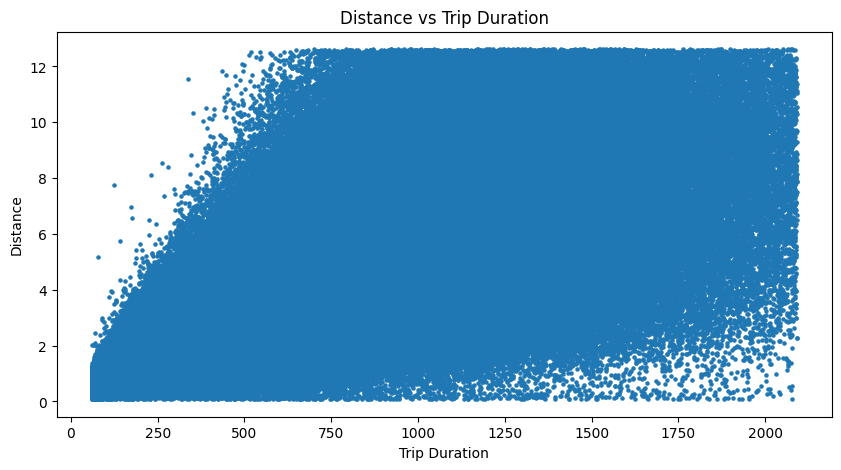

In [ ]:
plt.figure(figsize = (10,5))
plt.scatter(df_copy.trip_duration, df_copy.distance , s=5, alpha=1)
plt.ylabel('Distance')
plt.xlabel('Trip Duration')
plt.title('Distance vs Trip Duration')
plt.show()

In [ ]:
trip_duration_lower = df_copy[df_copy['trip_duration'] < 60]
trip_duration_lower

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,distance


In [ ]:
distance_lower = df_copy[df_copy['distance'] < 0.0804672]
distance_lower

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,distance


### One-Hot Encoding

In [ ]:
df_copy.replace({'store_and_fwd_flag': {'N': 0 , 'Y': 1}}, inplace=True)

<ipython-input-52-9caec74dd6a7>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<ipython-input-53-9738e2650151>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

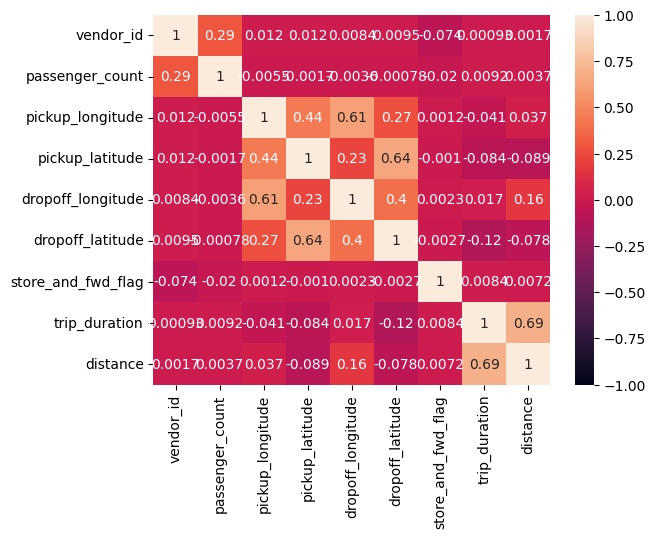

In [ ]:
sns.heatmap(df_copy.corr(), vmin=-1, vmax=1, annot=True)

### Split Data

In [ ]:
X1 = df_copy.drop(['id','pickup_datetime','dropoff_datetime','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','trip_duration'], axis=1)
y1 = df_copy['trip_duration']

In [ ]:
X1

,vendor_id,passenger_count,store_and_fwd_flag,distance
0,2,1,0,1.930833
1,1,2,0,6.636814
2,2,2,0,11.668386
3,2,6,0,3.795274
4,1,1,0,6.965455
...,...,...,...,...
729317,2,2,0,1.807393
729318,1,1,0,1.172504
729319,1,1,0,3.694905
729320,1,1,0,1.362660


In [ ]:
# Import train_test_split function
from sklearn.model_selection import train_test_split

# Split dataset into training set and test set
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.25)

## Ensemble Reggresion Forecasting

### Cross-Validated Regression

In [ ]:
# define kfold for cross validation
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [ ]:
#Create K-Neighbors Regressor object
knr = KNeighborsRegressor()

# Perform k cross-validation
kfold = KFold(n_splits=10, shuffle=True, random_state=42) # define kfold for cross validation
scores1 = cross_val_score(knr, X1_train, y1_train, cv=kfold, scoring='neg_mean_absolute_error')

# Train K-Neighbors Regressor
model1 = knr.fit(X1_train, y1_train)

# Predict the response for test dataset
y1_pred = model1.predict(X1_test)

# Print the cross-validation scores
print("Cross-validation scores:", scores1.mean()*-1)

Cross-validation scores: 234.9969730364679


In [ ]:
#Create Stochastic Gradient Descent Regressor object
sgdr = SGDRegressor()

# Perform k cross-validation
kfold = KFold(n_splits=10, shuffle=True, random_state=42) # define kfold for cross validation
scores1 = cross_val_score(sgdr, X1_train, y1_train, cv=kfold, scoring='neg_mean_absolute_error')

# Train K-Neighbors Regressor
model1 = sgdr.fit(X1_train, y1_train)

# Predict the response for test dataset
y1_pred = model1.predict(X1_test)

# Print the cross-validation scores
print("Cross-validation scores:", scores1.mean()*-1)

Cross-validation scores: 222.2186975685217


In [ ]:
#Create Stochastic Gradient Descent Regressor object
gbr = GradientBoostingRegressor()

# Perform k cross-validation
kfold = KFold(n_splits=10, shuffle=True, random_state=42) # define kfold for cross validation
scores1 = cross_val_score(gbr, X1_train, y1_train, cv=kfold, scoring='neg_mean_absolute_error')

# Train K-Neighbors Regressor
model1 = gbr.fit(X1_train, y1_train)

# Predict the response for test dataset
y1_pred = model1.predict(X1_test)

# Print the cross-validation scores
print("Cross-validation scores:", scores1.mean()*-1)

Cross-validation scores: 214.26701068026313


In [ ]:
#Create Stochastic Gradient Descent Regressor object
br = BayesianRidge()

# Perform k cross-validation
kfold = KFold(n_splits=10, shuffle=True, random_state=42) # define kfold for cross validation
scores1 = cross_val_score(br, X1_train, y1_train, cv=kfold, scoring='neg_mean_absolute_error')

# Train K-Neighbors Regressor
model1 = br.fit(X1_train, y1_train)

# Predict the response for test dataset
y1_pred = model1.predict(X1_test)

# Print the cross-validation scores
print("Cross-validation scores:", scores1.mean()*-1)

Cross-validation scores: 221.3598869294214


In [ ]:
#Create Random Forest Regressor object
lr = LinearRegression()

# Perform k cross-validation
kfold = KFold(n_splits=10, shuffle=True, random_state=42) # define kfold for cross validation
scores1 = cross_val_score(lr, X1_train, y1_train, cv=kfold, scoring='neg_mean_absolute_error')

# Train K-Neighbors Regressor
model1 = lr.fit(X1_train, y1_train)

# Predict the response for test dataset
y1_pred = model1.predict(X1_test)

# Print the cross-validation scores
print("Cross-validation scores:", scores1.mean()*-1)

Cross-validation scores: 221.3596289203452


### Stacked Regression

In [ ]:
knr_params = {'n_neighbors': [3, 5, 7]}
sgdr_params = {'alpha': [0.0001, 0.001, 0.01]}
gbr_params = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1.0]}
br_params = {'alpha_1': [1e-6, 1e-7, 1e-8], 'alpha_2': [1e-6, 1e-7, 1e-8]}
lr_params = {'fit_intercept': [True, False]}

# Perform hyperparameter tuning with grid search
models = [(knr, knr_params), (sgdr, sgdr_params), (gbr, gbr_params), (br, br_params), (lr, lr_params)]
for model, params in models:
    grid_search = GridSearchCV(model, params, scoring='neg_mean_absolute_error', cv=5)
    grid_search.fit(X1_train, y1_train)
    
    # Get the best model and its parameters
    best_model = grid_search.best_estimator_
    best_params = grid_search.best_params_
    
    # Evaluate the best model on the test set
    y1_pred = best_model.predict(X1_test)
    mae = mean_absolute_error(y1_test, y1_pred)
    
    # Print the results
    print(model.__class__.__name__)
    print("Best Parameters: ", best_params)
    print("MAE: ", mae)
    print()

KNeighborsRegressor
Best Parameters:  {'n_neighbors': 7}
MAE:  229.76764717128614

SGDRegressor
Best Parameters:  {'alpha': 0.001}
MAE:  222.21190762074775

GradientBoostingRegressor
Best Parameters:  {'learning_rate': 0.1, 'n_estimators': 200}
MAE:  214.5334467980849

BayesianRidge
Best Parameters:  {'alpha_1': 1e-06, 'alpha_2': 1e-06}
MAE:  221.78165907550806

LinearRegression
Best Parameters:  {'fit_intercept': True}
MAE:  221.78145571983504



In [ ]:
base_models = [
    ('KNR', KNeighborsRegressor(n_neighbors=7)),
    ('SGDR',SGDRegressor(alpha=0.001)),
    ('GBR',GradientBoostingRegressor(n_estimators=200, learning_rate=0.1)),
    ('BR',BayesianRidge(alpha_1=1e-06, alpha_2=1e-06))
    ]
stacked = StackingRegressor(
    estimators = base_models,
    final_estimator = LinearRegression(fit_intercept=True),
    cv = 5)

In [ ]:
import time
for name, model in base_models:
    start_time = time.time()
    model.fit(X1_train, y1_train)
    prediction = model.predict(X1_test)
    end_time = time.time()
    
    r2 = model.score(X1_test, y1_test)
    mean_absolute_error(y1_test, prediction)
    
    print("-------{}-------".format(name))
    print("Coefficient of determination: {}".format(r2))
    print("Mean Absolute Error: {}".format(mae))
    print("Computation Time: {}".format(end_time - start_time))
    print("----------------------------------\n")
start_time = time.time()
stacked.fit(X1_train, y1_train)    
stacked_prediction = stacked.predict(X1_test)
end_time = time.time()
stacked_r2 = stacked.score(X1_test, y1_test)
stacked_mae = mean_absolute_error(y1_test, stacked_prediction)
print("-------Stacked Ensemble-------")
print("Coefficient of determination: {}".format(stacked_r2))
print("Mean Absolute Error: {}".format(stacked_mae))
print("Computation Time: {}".format(end_time - start_time))
print("----------------------------------")

-------KNR-------
Coefficient of determination: 0.4281441845890992
Mean Absolute Error: 221.78145571983504
Computation Time: 6.565521955490112
----------------------------------

-------SGDR-------
Coefficient of determination: 0.47178271141785244
Mean Absolute Error: 221.78145571983504
Computation Time: 2.387589931488037
----------------------------------

-------GBR-------
Coefficient of determination: 0.499983949551119
Mean Absolute Error: 221.78145571983504
Computation Time: 66.20428371429443
----------------------------------

-------BR-------
Coefficient of determination: 0.47287818016230665
Mean Absolute Error: 221.78145571983504
Computation Time: 0.08414769172668457
----------------------------------

-------Stacked Ensemble-------
Coefficient of determination: 0.4999829440202863
Mean Absolute Error: 214.3233387740129
Computation Time: 391.72162437438965
----------------------------------


In [ ]:
base_models = [
    ('SGDR',SGDRegressor(alpha=0.001)),
    ('GBR',GradientBoostingRegressor(n_estimators=200, learning_rate=0.1)),
    ('BR',BayesianRidge(alpha_1=1e-06, alpha_2=1e-06)),
    ('LR',LinearRegression(fit_intercept=True))
    ]
stacked = StackingRegressor(
    estimators = base_models,
    final_estimator = KNeighborsRegressor(n_neighbors=7),
    cv = 5)

In [ ]:
for name, model in base_models:
    start_time = time.time()
    model.fit(X1_train, y1_train)
    prediction = model.predict(X1_test)
    end_time = time.time()
    
    r2 = model.score(X1_test, y1_test)
    mean_absolute_error(y1_test, prediction)
    
    print("-------{}-------".format(name))
    print("Coefficient of determination: {}".format(r2))
    print("Mean Absolute Error: {}".format(mae))
    print("Computation Time: {}".format(end_time - start_time))
    print("----------------------------------\n")
start_time = time.time()
stacked.fit(X1_train, y1_train)    
stacked_prediction = stacked.predict(X1_test)
end_time = time.time()
stacked_r2 = stacked.score(X1_test, y1_test)
stacked_mae = mean_absolute_error(y1_test, stacked_prediction)
print("-------Stacked Ensemble-------")
print("Coefficient of determination: {}".format(stacked_r2))
print("Mean Absolute Error: {}".format(stacked_mae))
print("Computation Time: {}".format(end_time - start_time))
print("----------------------------------")

-------SGDR-------
Coefficient of determination: 0.47239632219777394
Mean Absolute Error: 221.78145571983504
Computation Time: 3.963658094406128
----------------------------------

-------GBR-------
Coefficient of determination: 0.49998443076150834
Mean Absolute Error: 221.78145571983504
Computation Time: 67.14412593841553
----------------------------------

-------BR-------
Coefficient of determination: 0.47287818016230665
Mean Absolute Error: 221.78145571983504
Computation Time: 0.07928061485290527
----------------------------------

-------LR-------
Coefficient of determination: 0.47287794656963533
Mean Absolute Error: 221.78145571983504
Computation Time: 0.1306908130645752
----------------------------------

-------Stacked Ensemble-------
Coefficient of determination: 0.42839781690406753
Mean Absolute Error: 229.9801575198056
Computation Time: 380.10091614723206
----------------------------------


In [ ]:
base_models = [
    ('KNR', KNeighborsRegressor(n_neighbors=7)),
    ('SGDR',SGDRegressor(alpha=0.001)),
    ('BR',BayesianRidge(alpha_1=1e-06, alpha_2=1e-06)),
    ('LR',LinearRegression(fit_intercept=True))
    ]
stacked = StackingRegressor(
    estimators = base_models,
    final_estimator = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1),
    cv = 5)

In [ ]:
for name, model in base_models:
    start_time = time.time()
    model.fit(X1_train, y1_train)
    prediction = model.predict(X1_test)
    end_time = time.time()
    
    r2 = model.score(X1_test, y1_test)
    mean_absolute_error(y1_test, prediction)
    
    print("-------{}-------".format(name))
    print("Coefficient of determination: {}".format(r2))
    print("Mean Absolute Error: {}".format(mae))
    print("Computation Time: {}".format(end_time - start_time))
    print("----------------------------------\n")
start_time = time.time()
stacked.fit(X1_train, y1_train)    
stacked_prediction = stacked.predict(X1_test)
end_time = time.time()
stacked_r2 = stacked.score(X1_test, y1_test)
stacked_mae = mean_absolute_error(y1_test, stacked_prediction)
print("-------Stacked Ensemble-------")
print("Coefficient of determination: {}".format(stacked_r2))
print("Mean Absolute Error: {}".format(stacked_mae))
print("Computation Time: {}".format(end_time - start_time))
print("----------------------------------")

-------KNR-------
Coefficient of determination: 0.4281441845890992
Mean Absolute Error: 221.78145571983504
Computation Time: 9.046764612197876
----------------------------------

-------SGDR-------
Coefficient of determination: 0.4726966014180801
Mean Absolute Error: 221.78145571983504
Computation Time: 5.427009344100952
----------------------------------

-------BR-------
Coefficient of determination: 0.47287818016230665
Mean Absolute Error: 221.78145571983504
Computation Time: 0.10818004608154297
----------------------------------

-------LR-------
Coefficient of determination: 0.47287794656963533
Mean Absolute Error: 221.78145571983504
Computation Time: 0.1470050811767578
----------------------------------

-------Stacked Ensemble-------
Coefficient of determination: 0.498420520652164
Mean Absolute Error: 215.2053529258778
Computation Time: 314.250057220459
----------------------------------
